# RANSAC-based Image Stitching

## By: Mustafa Yildirim

## Part A) Affine Transformation-Based Mosaic Construction

Image stitching using an affine transformation is implemented. This process aligns images by estimating an affine transformation matrix, which models translation, rotation, isotropic scaling, and shear.

To construct the mosaic, keypoints are detected, and feature descriptors are extracted from the images. These features are then matched, and RANSAC is used to estimate the optimal affine transformation.

Finally, the images are warped and blended to generate the stitched output.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import kornia
import cv2

 **Step 1)** **Preprocessing** Load both images and convert to grayscale.

Image shape: (2575, 2556, 3)


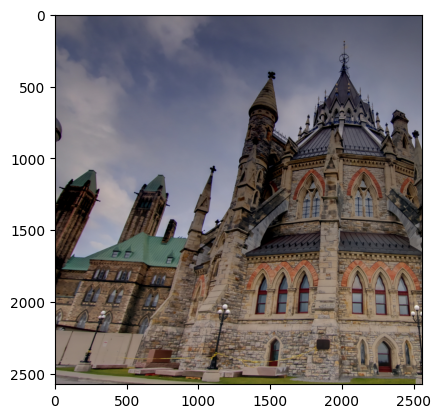

In [2]:
#img1_np = plt.imread('/content/parliament-left.jpg')
img1_np = plt.imread('images/parliament-left.jpg')
plt.imshow(img1_np)
print("Image shape:", img1_np.shape)

In [3]:
img1_grey= cv2.cvtColor(img1_np,cv2.COLOR_BGR2GRAY)

print("Grey image shape:",img1_grey.shape)

Grey image shape: (2575, 2556)


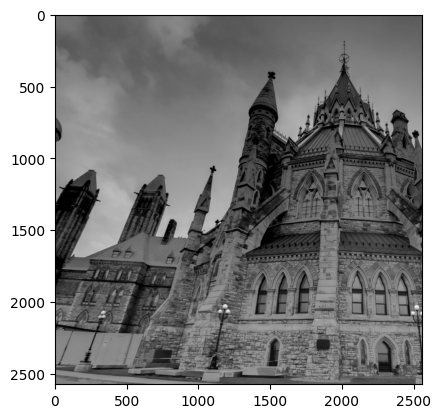

In [4]:
plt.imshow(img1_grey, cmap='gray')
plt.show()

Image shape: (2400, 2266, 3)


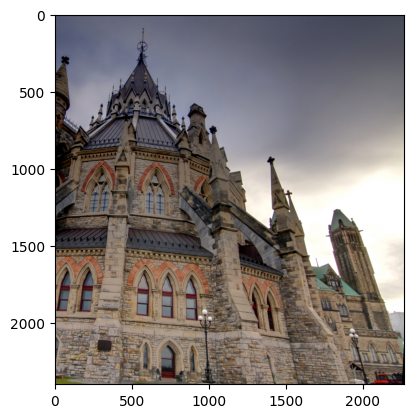

In [5]:
#img2_np = plt.imread('/content/parliament-right.jpg')
img2_np = plt.imread('images/parliament-right.jpg')
plt.imshow(img2_np)
print("Image shape:", img2_np.shape)

In [6]:
img2_grey= cv2.cvtColor(img2_np,cv2.COLOR_BGR2GRAY)

print("Grey image shape:",img2_grey.shape)

Grey image shape: (2400, 2266)


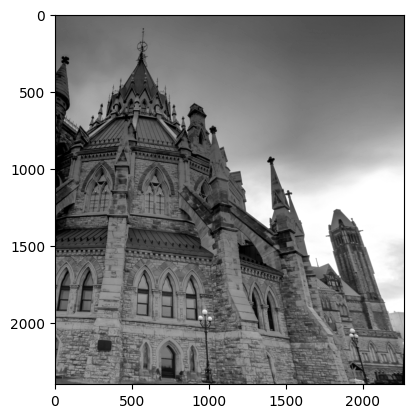

In [7]:
plt.imshow(img2_grey, cmap='gray')
plt.show()

 **Step 2)** **Detect keypoints and extract descriptors** Computing image features in both images. The feature detector and
 descriptor that is used is SIFT. 

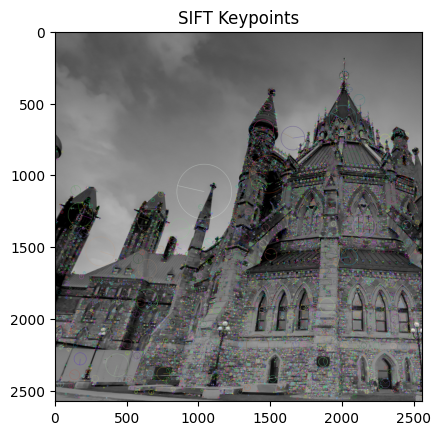

In [8]:
# Initializing SIFT detector
sift = cv2.SIFT_create()

# Detecting keypoints and computing descriptors for the first image
kp1, des1 = sift.detectAndCompute(img1_grey,None)

# Drawing keypoints on the first grayscale image
img1_keypoints = cv2.drawKeypoints(img1_grey, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the first image
plt.imshow(img1_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

In [9]:
print(len(kp1))
print(des1.shape)

16264
(16264, 128)


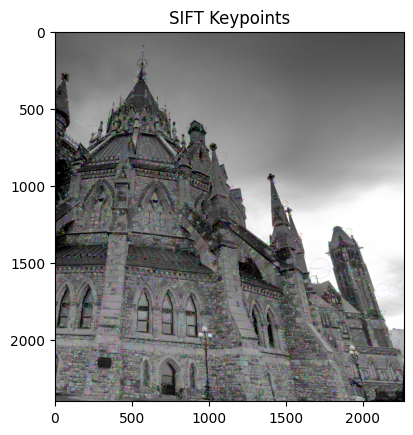

In [10]:
# Detecting keypoints and computing descriptors for the second image
kp2, des2 = sift.detectAndCompute(img2_grey,None)

# Drawing keypoints on the second grayscale image
img2_keypoints = cv2.drawKeypoints(img2_grey, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the second image
plt.imshow(img2_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

In [11]:
print(len(kp2))
print(des2.shape)

17392
(17392, 128)


 **Step 3)** **Match features** Computing the distances between every SIFT descriptor in one image and every descriptor in the other image.

In [12]:
from scipy.spatial.distance import cdist

In [13]:
# Computing the distances between every SIFT descriptor
dist = cdist(des1, des2, 'seuclidean')

**Step 4)** **Prune features** Selecting the closest matches based on the matrix of pairwise descriptor distances obtained above and displaying the locations of the inlier matches in both images using plot_inlier_matches.

In [14]:
threshold = 0.8
matches = []

# Looping through each descriptor
for i in range(len(dist)):

  # Finding the index of the closest descriptor
  index_min = np.argmin(dist[i])

  # Checking if the distance is below the threshold
  if dist[i][index_min] <  threshold:
    matches.append((i, index_min))

print(len(matches))

839


In [15]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')

    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')

# Usage:
# fig, ax = plt.subplots(figsize=(20,10))
# plot_inlier_matches(ax, img1, img2, computed_inliers)


In [16]:
inlier_matches = []

# Looping through each match to extract keypoint coordinates
for i, j in matches:
  # Appending the coordinates of the matching keypoints from both images
  inlier_matches.append([kp1[i].pt[0], kp1[i].pt[1], kp2[j].pt[0], kp2[j].pt[1]])

inliers = np.array(inlier_matches)

In [17]:
print(img1_grey.shape,img2_grey.shape)

(2575, 2556) (2400, 2266)


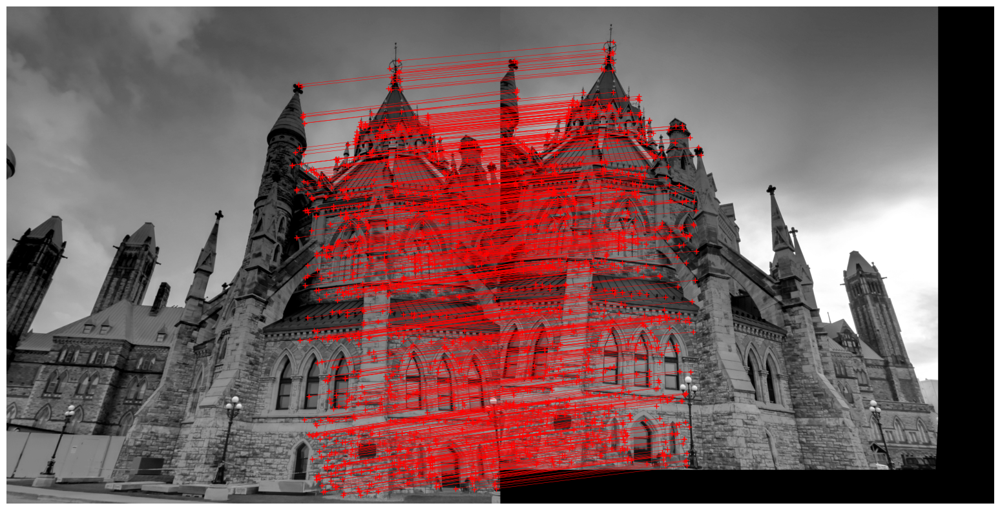

In [18]:
# Padding the second image using np.pad()
img2_grey_padded = np.pad(img2_grey, ((0, img1_grey.shape[0] - img2_grey.shape[0]), (0, img1_grey.shape[1] - img2_grey.shape[1])), mode='constant', constant_values=0)


# Displaying inlier matches
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, img1_grey, img2_grey_padded, inliers)
plt.show()

**Step 5)** **Robust transformation estimation** Implementing RANSAC to estimate an affine transformation mapping one image to the other using the minimum number of pairwise matches. 
 
Since the minimum number of pairwise points is used,  the transformation is estimated by using the inverse transformation rather than least-squares. 

In [19]:
# Getting matched points from both images
pts1 = np.array([kp1[i].pt for i, j in matches])
pts2 = np.array([kp2[j].pt for i, j in matches])

In [20]:
print(pts1.shape, pts2.shape)

(839, 2) (839, 2)


In [21]:
print(pts1)

[[1476.04467773  820.82727051]
 [1476.04467773  820.82727051]
 [1495.39453125  753.90106201]
 ...
 [2531.86206055 2430.97583008]
 [2535.78393555 2496.88427734]
 [2538.41308594 2290.19458008]]


In [22]:
print(pts2)

[[  14.36639595  683.79638672]
 [  14.36639595  683.79638672]
 [  36.89470291  619.38305664]
 ...
 [ 964.80426025 2313.03295898]
 [ 965.30474854 2377.77954102]
 [ 978.50726318 2175.56982422]]


In [23]:
import random

In [24]:
iterations = 5000
threshold = 0.6
best_inliers_count = 0
best_affine_m = None

In [25]:
# RANSAC implementation
for iteration in range(iterations):

  # The minimum number of pairwise matches  required to estimate an affine transformation is 3 pairs.
  # Randomly selecting 3 pairs of points
  i = random.sample(range(len(pts1)), 3)
  pts1_pair = pts1[i]
  pts2_pair = pts2[i]

  # Calculating the affine matrix
  A = []
  b_v = []

  for i in range(len(pts1_pair)):
    x, y = pts1_pair[i]
    x_p, y_p = pts2_pair[i]
    A.append([x, y, 1, 0, 0, 0])
    A.append([0, 0, 0, x, y, 1])
    b_v.append(x_p)
    b_v.append(y_p)

  A = np.array(A)
  b_v = np.array(b_v)

  # Inverse transformation
  params = np.linalg.pinv(A) @ b_v

  # Transformation parameters
  a, b, e, c, d, f = params
  affine_m = np.array([[a, b, e],[c, d, f]])

  # Applying the transformation to all points in pts1
  pts1_homo = np.ones((pts1.shape[0], 3))
  pts1_homo[:, :2] = pts1
  new_pts = (affine_m @ pts1_homo.T).T

  # Calculating distances to corresponding points in pts2
  p_dist = np.linalg.norm(new_pts - pts2, axis=1)

  # Determining inliers
  mask = p_dist < threshold
  inliers = np.arange(len(p_dist))[mask]
  inliers_count = np.sum(mask)

  # Updating the best matrix if the current one has more inliers
  if inliers_count > best_inliers_count:
    best_inliers_count = inliers_count
    best_affine_m = affine_m
    best_inliers = inliers

In [26]:
print(best_inliers_count)
print("Best Affine Matrix:\n", best_affine_m)

836
Best Affine Matrix:
 [[ 9.78330493e-01 -5.11683860e-02 -1.38762139e+03]
 [ 5.13667438e-02  9.78057678e-01 -1.94697874e+02]]


In [27]:
print(A.shape)
print(A)

(6, 6)
[[1.86141467e+03 6.22183716e+02 1.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.86141467e+03
  6.22183716e+02 1.00000000e+00]
 [2.11965698e+03 1.37052393e+03 1.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 2.11965698e+03
  1.37052393e+03 1.00000000e+00]
 [2.53186206e+03 2.43097583e+03 1.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 2.53186206e+03
  2.43097583e+03 1.00000000e+00]]


In [28]:
print(b_v.shape)
print(b_v)

(6,)
[ 401.60327148  509.30764771  615.9473877  1254.5201416   964.80426025
 2313.03295898]


In [29]:
print(params.shape)
print(params)

(6,)
[ 9.75326884e-01 -5.01463777e-02 -1.38268424e+03  5.38967855e-02
  9.77221394e-01 -1.99027858e+02]


In [30]:
print(affine_m.shape)
print(affine_m)

(2, 3)
[[ 9.75326884e-01 -5.01463777e-02 -1.38268424e+03]
 [ 5.38967855e-02  9.77221394e-01 -1.99027858e+02]]


**Step 6)** **Compute optimal transformation** Computing the optimal transformation using all the inliers of the best transformation found using RANSAC and computing the final transformation with least-squares.

In [31]:
# Extracting inliers points based on the best inliers
inliers_pts1 = pts1[best_inliers]
inliers_pts2 = pts2[best_inliers]

# Calculating the affine matrix
A = []
b_v = []

for i in range(len(pts1_pair)):
  x, y = pts1_pair[i]
  x_p, y_p = pts2_pair[i]
  A.append([x, y, 1, 0, 0, 0])
  A.append([0, 0, 0, x, y, 1])
  b_v.append(x_p)
  b_v.append(y_p)

A = np.array(A)
b_v = np.array(b_v)

# Solving with using least-squares
optimal_params = np.linalg.inv(A.T @ A) @ A.T @ b_v

# Transformation parameters
a, b, e, c, d, f = optimal_params
final_affine_m = np.array([[a, b, e],[c, d, f]])

In [32]:
print(final_affine_m)

[[ 9.75326884e-01 -5.01463777e-02 -1.38268424e+03]
 [ 5.38967855e-02  9.77221394e-01 -1.99027858e+02]]


**Step 7)** **Create panorama** Using the final affine transformation obtained from RANSAC, generating the mosaic and displaying the color mosaic result on the screen.

In [33]:
from skimage import transform

In [34]:
# Converting images from RGB to BGR
img1 = cv2.cvtColor(img1_np, cv2.COLOR_RGB2BGR)
img2 = cv2.cvtColor(img2_np, cv2.COLOR_RGB2BGR)

# Converting 2x3 affine matrix to 3x3 to use it in the transform.ProjectiveTransform()
affine_m_adjusted = np.vstack([final_affine_m, [0, 0, 1]])

# Getting the projective transform
proj_transform = transform.ProjectiveTransform(matrix=affine_m_adjusted)

# Creating the mosiac boundaries and canvas size
height, width = img1.shape[:2]
corners = np.array([[0, 0], [width, 0], [0, height], [width, height]])
corners_trans = proj_transform(corners)

x_min = min(0, corners_trans[:, 0].min())
x_max = max(img2.shape[1], corners_trans[:, 0].max())

y_min = min(0, corners_trans[:, 1].min())
y_max = max(img2.shape[0], corners_trans[:, 1].max())

mosaic = np.zeros((int(y_max - y_min), int(x_max - x_min), 3), dtype=np.float32)

# Placing img2 onto the mosaic
mosaic[-int(y_min):-int(y_min) + img2.shape[0], -int(x_min):-int(x_min) + img2.shape[1]] = img2 / 255

# Adjusting the transformation to account for the offset if min_x or min_y is negative
translation_m = np.array([[1, 0, -x_min],[0, 1, -y_min],[0, 0, 1]])
adjusted_transform = translation_m @ affine_m_adjusted

proj_transform2 = transform.ProjectiveTransform(matrix=adjusted_transform)

# Warping img1 onto the mosaic
warped_img1 = transform.warp(img1, inverse_map=proj_transform2.inverse, output_shape=(int(y_max - y_min), int(x_max - x_min)))

# Blending images by taking the max pixel value
for channel in range(3):
  mosaic[..., channel] = np.maximum(mosaic[..., channel], warped_img1[..., channel])

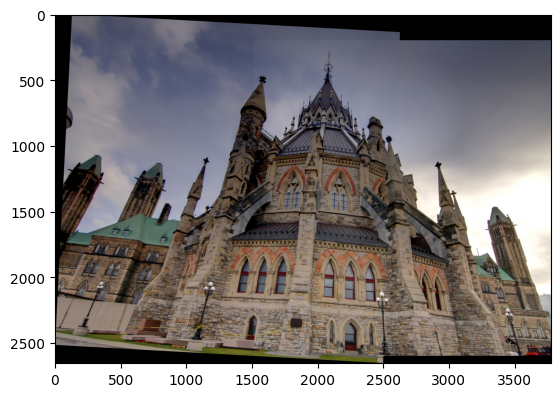

In [35]:
# Displaying the colour mosaic result
plt.imshow(cv2.cvtColor(mosaic, cv2.COLOR_BGR2RGB))
plt.show()

## Part B) Homography-Based Panorama Construction

Image stitching using a homography transformation is implemented. Keypoints are detected, and feature descriptors are extracted and matched between images. RANSAC is used to estimate the optimal homography transformation with a minimum of four point correspondences.

A system of homogeneous linear equations is formulated, and the solution is obtained using Singular Value Decomposition (SVD) by selecting the singular vector corresponding to the smallest singular value. The images are then registered, warped, and blended to generate the final stitched panorama.

Finally, using the RANSAC-based homography, the mosaic is generated from the given image pair, and the color mosaic result is displayed on the screen.

**Doing this part on the left and middle images first**

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import kornia
import cv2

 **Step 1)** **Preprocessing** Loading the images and convert to grayscale.

Image shape: (3024, 4032, 3)
Grey image shape: (3024, 4032)


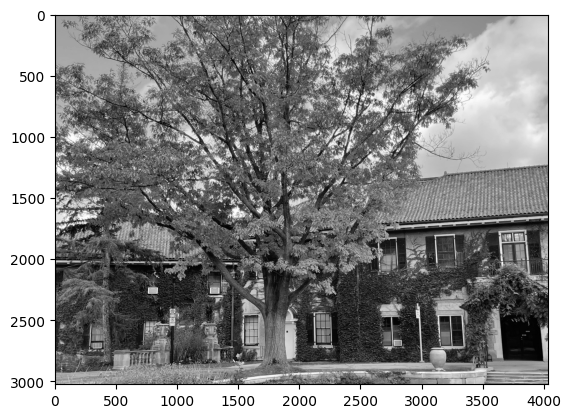

In [37]:
#img_left_np = plt.imread('/content/Glendon-Hall-left.jpg')
img_left_np = plt.imread('images/Glendon-Hall-left.jpg')
plt.imshow(img_left_np)
print("Image shape:", img_left_np.shape)

img_left_grey= cv2.cvtColor(img_left_np,cv2.COLOR_BGR2GRAY)

print("Grey image shape:",img_left_grey.shape)

plt.imshow(img_left_grey, cmap='gray')
plt.show()

Image shape: (3024, 4032, 3)
Grey image shape: (3024, 4032)


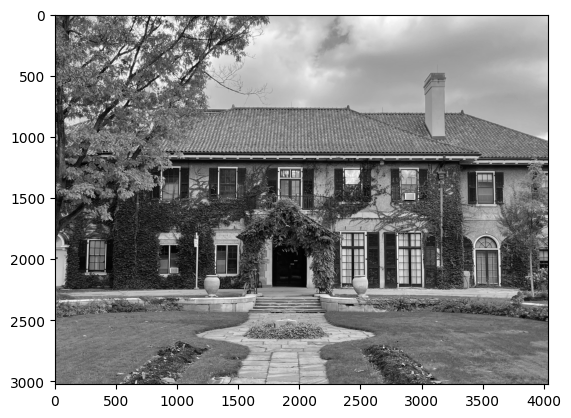

In [38]:
#img_mid_np = plt.imread('/content/Glendon-Hall-middle.jpg')
img_mid_np = plt.imread('images/Glendon-Hall-middle.jpg')
plt.imshow(img_mid_np)
print("Image shape:", img_mid_np.shape)

img_mid_grey= cv2.cvtColor(img_mid_np,cv2.COLOR_BGR2GRAY)

print("Grey image shape:",img_mid_grey.shape)

plt.imshow(img_mid_grey, cmap='gray')
plt.show()

Image shape: (3024, 4032, 3)
Grey image shape: (3024, 4032)


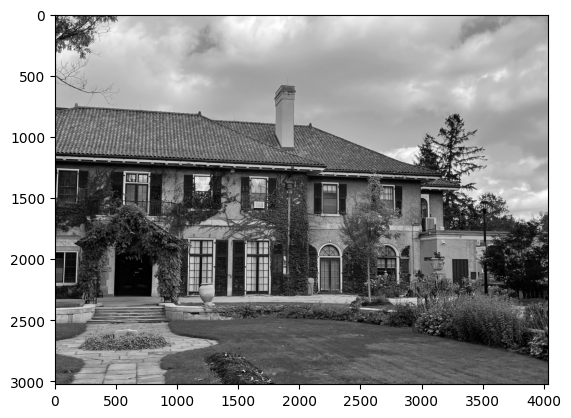

In [39]:
#img_right_np = plt.imread('/content/Glendon-Hall-right.jpg')
img_right_np = plt.imread('images/Glendon-Hall-right.jpg')
plt.imshow(img_right_np)
print("Image shape:", img_right_np.shape)

img_right_grey= cv2.cvtColor(img_right_np,cv2.COLOR_BGR2GRAY)

print("Grey image shape:",img_right_grey.shape)

plt.imshow(img_right_grey, cmap='gray')
plt.show()

 **Step 2)** **Detecting keypoints and extract descriptors**

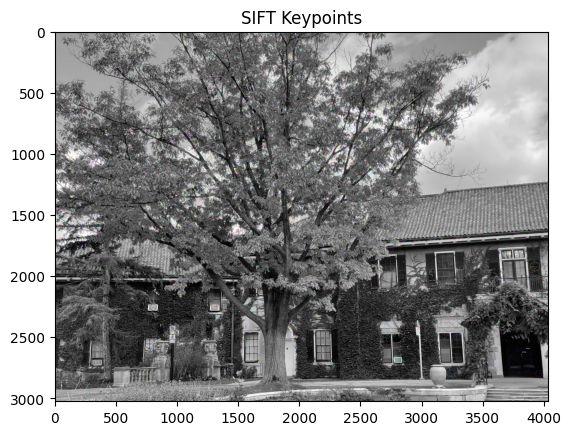

In [40]:
# Initializing SIFT detector with 20000 features (limiting the feature number to minimize size)
sift = cv2.SIFT_create(nfeatures=20000)

# Detecting keypoints and computing descriptors for the left image
kp_left, des_left = sift.detectAndCompute(img_left_grey,None)

# Drawing keypoints on the left grayscale image
img_left_keypoints = cv2.drawKeypoints(img_left_grey, kp_left, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the left image
plt.imshow(img_left_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

In [41]:
print(len(kp_left))
print(des_left.shape)

20000
(20000, 128)


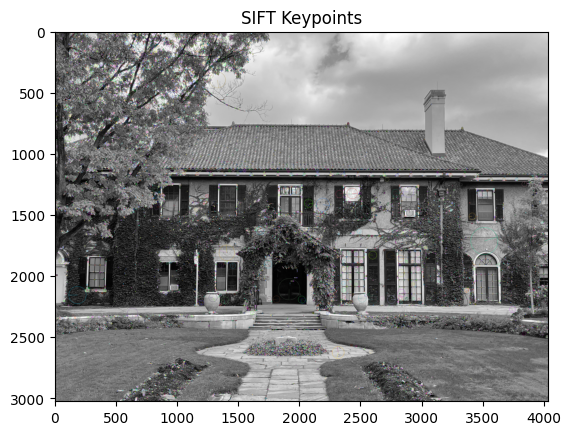

In [42]:
# Detecting keypoints and computing descriptors for the mid image
kp_mid, des_mid = sift.detectAndCompute(img_mid_grey,None)

# Drawing keypoints on the mid grayscale image
img_mid_keypoints = cv2.drawKeypoints(img_mid_grey, kp_mid, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the mid image
plt.imshow(img_mid_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

In [43]:
print(len(kp_mid))
print(des_mid.shape)

20001
(20001, 128)


 **Step 3)** **Match features** Computing distances between every SIFT descriptor in one image and every descriptor in the other image.

In [44]:
from scipy.spatial.distance import cdist

In [45]:
# Computing distances between descriptors of left and middle images
dist_left_mid = cdist(des_left, des_mid, 'seuclidean')

print(dist_left_mid.shape)

(20000, 20001)


  **Step 4)** **Prune features** Selecting the closest matches based on the matrix of pairwise descriptor distances obtained above and displaying the locations of the inlier matches in both images using plot_inlier_matches.

In [46]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')

    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')

# Usage:
# fig, ax = plt.subplots(figsize=(20,10))
# plot_inlier_matches(ax, img1, img2, computed_inliers)

In [47]:
threshold = 2.3
matches_left_mid = []

# Looping through each descriptor
for i in range(len(dist_left_mid)):
  
  # Finding the index of the closest descriptor
  min_index = np.argmin(dist_left_mid[i])
  
  # Checking if the distance is below the threshold
  if dist_left_mid[i][min_index] < threshold:
    matches_left_mid.append((i, min_index))

print(len(matches_left_mid))

221


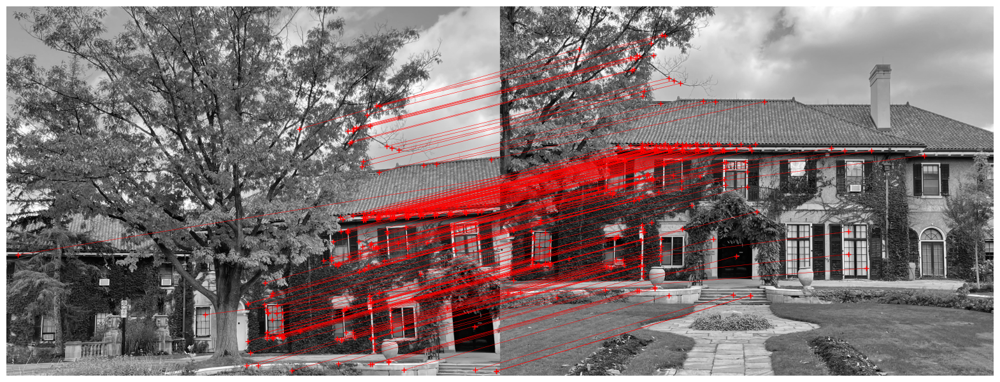

In [48]:
# For the left-middle image pair
inlier_matches_left_mid = []

# Looping through each match to extract keypoint coordinates
for i, j in matches_left_mid:
  inlier_matches_left_mid.append([kp_left[i].pt[0], kp_left[i].pt[1],kp_mid[j].pt[0], kp_mid[j].pt[1]])

inlier_matches_left_mid = np.array(inlier_matches_left_mid)

# Displaying inlier matches for left-middle
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, img_left_grey, img_mid_grey, inlier_matches_left_mid)
plt.show()

**Step 5)** **Robust transformation estimation** Implementing RANSAC using homography.

**RANSAC Homography for Left and Mid images**

In [49]:
import random

In [50]:
# Getting matched points from both images
pts_left = np.array([kp_left[i].pt for i, j in matches_left_mid])
pts_mid = np.array([kp_mid[j].pt for i, j in matches_left_mid])

In [51]:
iterations = 2000
threshold = 3.0
best_inliers_count = 0
best_homography_left_mid = None

In [52]:
# RANSAC implementation
for iteration in range(iterations):

  # Randomly selecting 4 pairs of points
  i = random.sample(range(len(pts_left)), 4)
  pts_left_pair = pts_left[i]
  pts_mid_pair = pts_mid[i]

  # Calculating the homography matrix
  A = []
  for i in range(len(pts_left_pair)):
    x, y = pts_left_pair[i]
    x_p, y_p = pts_mid_pair[i]
    A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p, x_p])
    A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p, y_p])

  A = np.array(A)

  # Solving for the homography using SVD
  U, S, V = np.linalg.svd(A)
  h = V[len(V)-1]
  
  # Reshaping to get the 3x3 homography matrix
  homography_m = h.reshape(3, 3)

  # Applying the transformation to all points in pts_left
  pts_left_homo = np.ones((pts_left.shape[0], 3))
  pts_left_homo[:, :2] = pts_left
  new_pts_homo = (homography_m @ pts_left_homo.T).T

  # Normalizing (x', y') by dividing by the third coordinate (w) to convert from homogeneous to Cartesian coordinates
  w = new_pts_homo[:, 2, np.newaxis]
  new_pts = new_pts_homo[:, :2] / w

  # Calculating distances to corresponding points in pts_mid
  p_dist = np.linalg.norm(new_pts - pts_mid, axis=1)

  # Determining inliers
  mask = p_dist < threshold
  inliers = np.arange(len(p_dist))[mask]
  inliers_count = np.sum(mask)

  # Updating the best homography if the current one has more inliers
  if inliers_count > best_inliers_count:
    best_inliers_count = inliers_count
    best_homography_left_mid = homography_m
    best_inliers = inliers

In [53]:
print(best_inliers_count)
print(best_homography_left_mid)

155
[[-4.94123959e-04  2.30723925e-05  8.72591822e-01]
 [-7.29437962e-05 -4.65981941e-04  4.88449515e-01]
 [-3.42480650e-08 -9.25873788e-09 -3.41314855e-04]]


 **Step 6)** **Compute optimal transformation** Computing the optimal transformation using all the inliers of the best transformation found using RANSAC.

In [54]:
# Extracting inliers points based on the best inliers
inlier_pts_left = pts_left[best_inliers]
inlier_pts_mid = pts_mid[best_inliers]

A = []
for i in range(len(inlier_pts_left)):
  x, y = inlier_pts_left[i]
  x_p, y_p = inlier_pts_mid[i]
    
  # Homogeneous system of equations for each inlier correspondence
  A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p, x_p])
  A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p, y_p])

A = np.array(A)

# Solving for homography using SVD
U, S, V = np.linalg.svd(A)
h = V[len(V)-1]

# Reshaping to get the 3x3 homography matrix
final_homography_m_left_mid = h.reshape(3, 3)

print(final_homography_m_left_mid)

[[ 4.94693422e-04 -2.33373603e-05 -8.73245413e-01]
 [ 7.28484678e-05  4.65835071e-04 -4.87280067e-01]
 [ 3.40797019e-08  8.79686918e-09  3.43166576e-04]]


 **Step 7)** **Create panorama**

In [55]:
from skimage import transform

In [56]:
# Converting images from RGB to BGR
img_left = cv2.cvtColor(img_left_np, cv2.COLOR_RGB2BGR)
img_mid = cv2.cvtColor(img_mid_np, cv2.COLOR_RGB2BGR)

# Creating the projective transform using the homography matrix
proj_transform = transform.ProjectiveTransform(matrix=final_homography_m_left_mid)

# Creating the mosaic boundaries and canvas size
height, width = img_left.shape[:2]
corners_img_left = np.array([[0, 0], [width, 0], [0, height], [width, height]])
corners_trans = proj_transform(corners_img_left)

x_min = min(0, corners_trans[:, 0].min())
y_min = min(0, corners_trans[:, 1].min())
x_max = max(img_mid.shape[1], corners_trans[:, 0].max())
y_max = max(img_mid.shape[0], corners_trans[:, 1].max())

mosaic_left_mid = np.zeros((int(y_max - y_min), int(x_max - x_min), 3), dtype=np.float32)

# Placing img_mid onto the mosaic as the base image
mosaic_left_mid[-int(y_min):-int(y_min) + img_mid.shape[0], -int(x_min):-int(x_min) + img_mid.shape[1]] = img_mid / 255

# Adjusting the transformation to account for the offset if min_x or min_y is negative
translation_m = np.array([[1, 0, -x_min],[0, 1, -y_min],[0, 0, 1]])
adjusted_transform = translation_m @ final_homography_m_left_mid

proj_transform2 = transform.ProjectiveTransform(matrix=adjusted_transform)

# Warping img_left onto the mosaic
warped_img_left = transform.warp(img_left, inverse_map=proj_transform2.inverse, output_shape=(int(y_max - y_min), int(x_max - x_min)))

# Blending images by taking the max pixel value
for channel in range(3):
  mosaic_left_mid[..., channel] = np.maximum(mosaic_left_mid[..., channel], warped_img_left[..., channel])

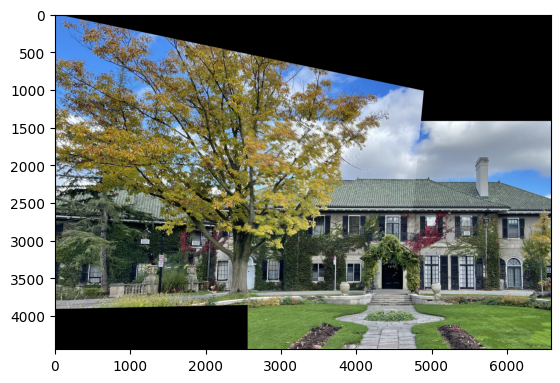

In [57]:
# Displaying the colour mosaic result
plt.imshow(cv2.cvtColor(mosaic_left_mid, cv2.COLOR_BGR2RGB))
plt.show()

**Repeating the previous steps using mosaic_left_mid (left-mid image) and the right image**

 **Step 1)** **Preprocessing** Loading the images and convert to grayscale.

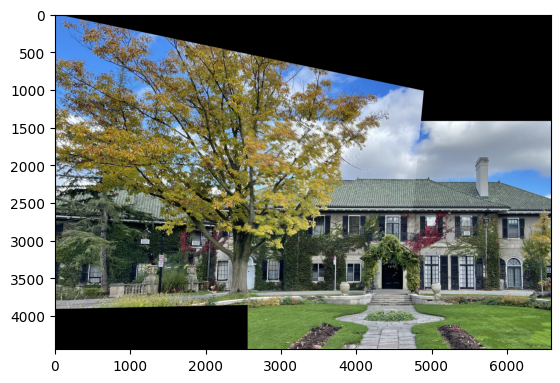

In [58]:
# Converting BGR mosaic image to RGB
img_lm = cv2.cvtColor(mosaic_left_mid, cv2.COLOR_BGR2RGB) #image left-mid
plt.imshow(img_lm)
plt.show()

In [59]:
print(img_lm.dtype)

float32


In [60]:
img_lm = (img_lm * 255).astype(np.uint8)
print(img_lm.dtype)

uint8


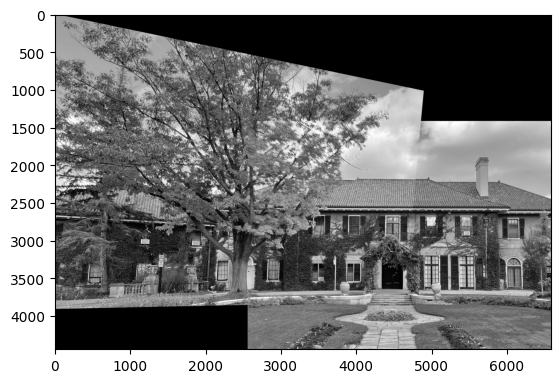

In [61]:
img_lm_grey = cv2.cvtColor(img_lm, cv2.COLOR_BGR2GRAY)
plt.imshow(img_lm_grey, cmap='gray')
plt.show()

 **Step 2)** **Detect keypoints and extract descriptors** Computing image features in both images.

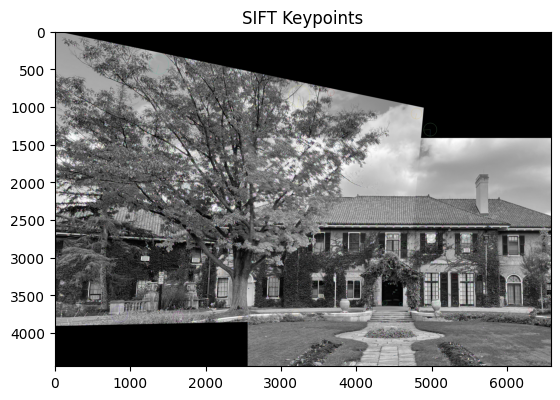

In [62]:
# Initializing SIFT detector with it having at most 20000 features
sift = cv2.SIFT_create(nfeatures=20000)

# Detecting keypoints and computing descriptors for the mosaic
kp_lm, des_lm = sift.detectAndCompute(img_lm_grey, None)

# Drawing keypoints on the grayscale mosiac
img_lm_keypoints = cv2.drawKeypoints(img_lm_grey, kp_lm, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the mosaic
plt.imshow(img_lm_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()


In [63]:
print(len(kp_lm))
print(des_lm.shape)

20000
(20000, 128)


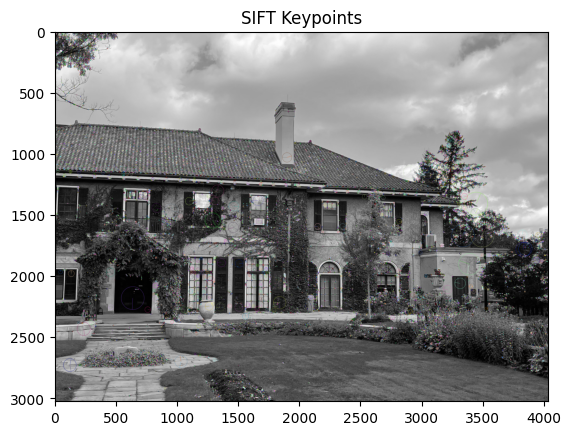

In [64]:
# Detecting keypoints and computing descriptors for the right image
kp_right, des_right = sift.detectAndCompute(img_right_grey,None)

# Drawing keypoints on the right grayscale image
img_right_keypoints = cv2.drawKeypoints(img_right_grey, kp_right, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the right image
plt.imshow(img_right_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

In [65]:
print(len(kp_right))
print(des_right.shape)

20000
(20000, 128)


 **Step 3)** **Match features** Computing the distances between every SIFT descriptor in one image and every descriptor in the other image.

In [66]:
from scipy.spatial.distance import cdist

In [67]:
# Computing distances between descriptors of the mosiac and the right image
dist_lm_right = cdist(des_lm, des_right, 'seuclidean')

print(dist_lm_right.shape)

(20000, 20000)


  **Step 4)** **Prune features** Selecting the closest matches based on the matrix of pairwise descriptor distances obtained above and displaying the locations of the inlier matches in both images using plot_inlier_matches.

In [68]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')

    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')

# Usage:
# fig, ax = plt.subplots(figsize=(20,10))
# plot_inlier_matches(ax, img1, img2, computed_inliers)

In [69]:
threshold = 2.5
matches_lf_right = []

# Looping through each descriptor
for i in range(len(dist_lm_right)):
  
  # Finding the index of the closest descriptor
  min_index = np.argmin(dist_lm_right[i])
  
  # Checking if the distance is below the threshold
  if dist_lm_right[i][min_index] < threshold:
    matches_lf_right.append((i, min_index))

print(len(matches_lf_right))

396


In [70]:
print(img_lm_grey.shape, img_right_grey.shape)

(4443, 6584) (3024, 4032)


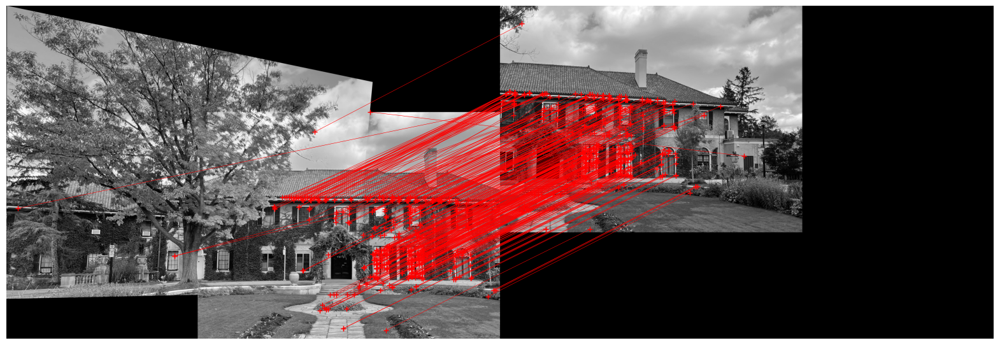

In [71]:
# For the left-middle image pair
inlier_matches_lm_right = []

# Looping through each match to extract keypoint coordinates
for i, j in matches_lf_right:
  
  # Appending the coordinates of the matching keypoints from both images
  inlier_matches_lm_right.append([kp_lm[i].pt[0], kp_lm[i].pt[1],kp_right[j].pt[0], kp_right[j].pt[1]])

inlier_matches_lm_right = np.array(inlier_matches_lm_right)

# Padding the right image
img_right_padded = np.pad(img_right_grey, ((0, img_lm_grey.shape[0] - img_right_grey.shape[0]), ( 0, img_lm_grey.shape[1] - img_right_grey.shape[1])), mode='constant', constant_values=0)

# Displaying inlier matches for left-middle
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, img_lm_grey, img_right_padded, inlier_matches_lm_right)
plt.show()

**Step 5)** **Robust transformation estimation** Implementing RANSAC using homography.

**RANSAC Homography for left-mid and right images**

In [72]:
# Getting matched points from both images
pts_lm = np.array([kp_lm[i].pt for i, j in matches_lf_right])
pts_right = np.array([kp_right[j].pt for i, j in matches_lf_right])

In [73]:
iterations = 2000
threshold = 3.5
best_inliers_count = 0
best_homography_lm_right = None

In [74]:
# RANSAC implementation
for iteration in range(iterations):

  # Randomly selecting 4 pairs of points
  i = random.sample(range(len(pts_lm)), 4)
  pts_lm_pair = pts_lm[i]
  pts_right_pair = pts_right[i]

  # Calculating the homography matrix
  A = []
  for i in range(len(pts_lm_pair)):
    x, y = pts_lm_pair[i]
    x_p, y_p = pts_right_pair[i]
    A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p, x_p])
    A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p, y_p])

  A = np.array(A)

  # Solving for the homography using SVD
  U, S, V = np.linalg.svd(A)
  h = V[len(V)-1]
  
  # Reshaping to get the 3x3 homography matrix
  homography_m = h.reshape(3, 3)

  # Applying the transformation to all points in pts_lm 
  pts_lm_homo = np.ones((pts_lm.shape[0], 3)) 
  pts_lm_homo[:, :2] = pts_lm
  new_pts_homo = (homography_m @ pts_lm_homo.T).T

  # Normalizing (x', y') by dividing by the third coordinate (w) to convert from homogeneous to Cartesian coordinates
  w = new_pts_homo[:, 2, np.newaxis]
  new_pts = new_pts_homo[:, :2] / w

  # Calculating distances to corresponding points in pts_right (right image)
  p_dist = np.linalg.norm(new_pts - pts_right, axis=1)

  # Determining inliers
  mask = p_dist < threshold
  inliers = np.arange(len(p_dist))[mask]
  inliers_count = np.sum(mask)

  # Updating the best homography if the current one has more inliers
  if inliers_count > best_inliers_count:
    best_inliers_count = inliers_count
    best_homography_lm_right = homography_m
    best_inliers = inliers

In [75]:
print(best_inliers_count)
print(best_homography_lm_right)

257
[[-2.37827928e-04  5.63543281e-06  9.06329589e-01]
 [-2.41108678e-05 -2.20413339e-04  4.22571349e-01]
 [-1.20715157e-08  4.31619418e-10 -1.59926560e-04]]


 **Step 6)** **Compute optimal transformation** Computing the optimal transformation using all the inliers of the best transformation found using RANSAC.

In [76]:
# Extracting inliers points based on the best inliers
inlier_pts_lm = pts_lm[best_inliers]
inlier_pts_right = pts_right[best_inliers]

A = []
for i in range(len(inlier_pts_lm)):
  x, y = inlier_pts_lm[i]
  x_p, y_p = inlier_pts_right[i]
    
  # Homogeneous system of equations for each inlier correspondence
  A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p, x_p])
  A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p, y_p])

A = np.array(A)

# Solving for homography using SVD
U, S, V = np.linalg.svd(A)
h = V[len(V)-1]

# Reshaping to get the 3x3 homography matrix
final_homography_m_lm_right = h.reshape(3, 3)

print(final_homography_m_lm_right)

[[-2.38313683e-04  6.45558257e-06  9.05947330e-01]
 [-2.44626109e-05 -2.20136773e-04  4.23390250e-01]
 [-1.22501658e-08  7.94463104e-10 -1.60283363e-04]]


 **Step 7)** **Create panorama**

In [77]:
from skimage import transform

In [78]:
# Converting images from RGB to BGR
img_lm = cv2.cvtColor(img_lm, cv2.COLOR_RGB2BGR)
img_right = cv2.cvtColor(img_right_np, cv2.COLOR_RGB2BGR)

# Creating the projective transform using the homography matrix
proj_transform = transform.ProjectiveTransform(matrix=final_homography_m_lm_right)

# Creating the mosaic boundaries and canvas size
height, width = img_lm.shape[:2]
corners_img_lm = np.array([[0, 0], [width, 0], [0, height], [width, height]])
corners_trans = proj_transform(corners_img_lm)

x_min = min(0, corners_trans[:, 0].min())
y_min = min(0, corners_trans[:, 1].min())
x_max = max(img_right.shape[1], corners_trans[:, 0].max())
y_max = max(img_right.shape[0], corners_trans[:, 1].max())

mosaic_lm_right = np.zeros((int(y_max - y_min), int(x_max - x_min), 3), dtype=np.float32)

# Placing img_right onto the mosaic as the base image
mosaic_lm_right[-int(y_min):-int(y_min) + img_right.shape[0], -int(x_min):-int(x_min) + img_right.shape[1]] = img_right / 255

# Adjusting the transformation to account for the offset if min_x or min_y is negative
translation_m = np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]])
adjusted_transform_lm_right = translation_m @ final_homography_m_lm_right

proj_transform2 = transform.ProjectiveTransform(matrix=adjusted_transform_lm_right)

# Warping img_lm (Left-Mid) onto the mosaic
warped_img_lm = transform.warp(img_lm, inverse_map=proj_transform2.inverse, output_shape=(int(y_max - y_min), int(x_max - x_min)))

# Blending images by taking the max pixel value
for channel in range(3):
  mosaic_lm_right[..., channel] = np.maximum(mosaic_lm_right[..., channel], warped_img_lm[..., channel])

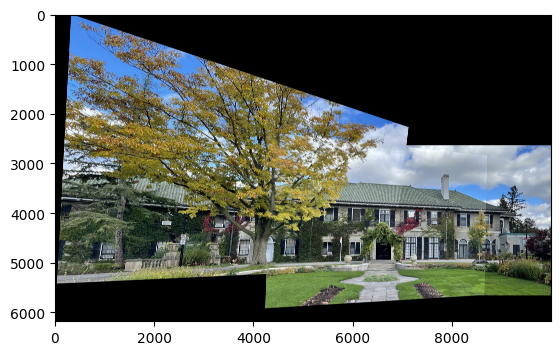

In [79]:
# Displaying the final combined panorama
plt.imshow(cv2.cvtColor(mosaic_lm_right, cv2.COLOR_BGR2RGB))
plt.show()

 2) Testing on a Custom Image Set and visualizing the stitched result.

**Doing this part on the left and middle image of my own chosing first**

 **Step 1)** **Preprocessing** Loading the images and convert to grayscale.

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import kornia
import cv2

Image shape: (3000, 4000, 3)
Grey image shape: (3000, 4000)


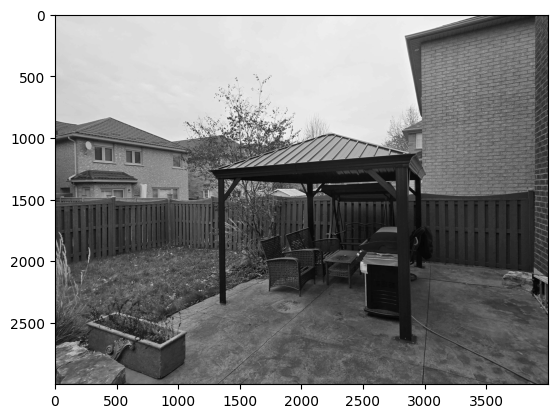

In [81]:
left_img = plt.imread('images/left.jpg')
plt.imshow(left_img)
print("Image shape:", left_img.shape)

left_img_grey= cv2.cvtColor(left_img,cv2.COLOR_BGR2GRAY)

print("Grey image shape:",left_img_grey.shape)

plt.imshow(left_img_grey, cmap='gray')
plt.show()

Image shape: (3000, 4000, 3)
Grey image shape: (3000, 4000)


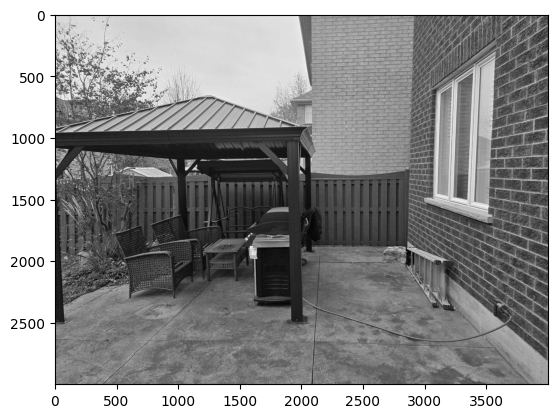

In [82]:
mid_img = plt.imread('images/mid.jpg')
plt.imshow(mid_img)
print("Image shape:", mid_img.shape)

mid_img_grey= cv2.cvtColor(mid_img,cv2.COLOR_BGR2GRAY)

print("Grey image shape:",mid_img_grey.shape)

plt.imshow(mid_img_grey, cmap='gray')
plt.show()

Image shape: (3000, 4000, 3)
Grey image shape: (3000, 4000)


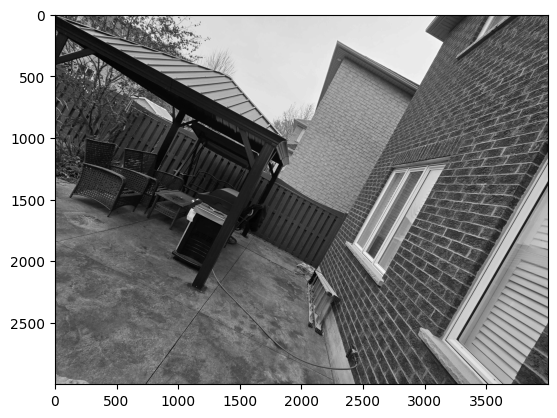

In [83]:
right_img = plt.imread('images/right.jpg')
plt.imshow(right_img)
print("Image shape:", right_img.shape)

rigt_img_grey= cv2.cvtColor(right_img,cv2.COLOR_BGR2GRAY)

print("Grey image shape:",rigt_img_grey.shape)

plt.imshow(rigt_img_grey, cmap='gray')
plt.show()

 **Step 2)** **Detect keypoints and extract descriptors**

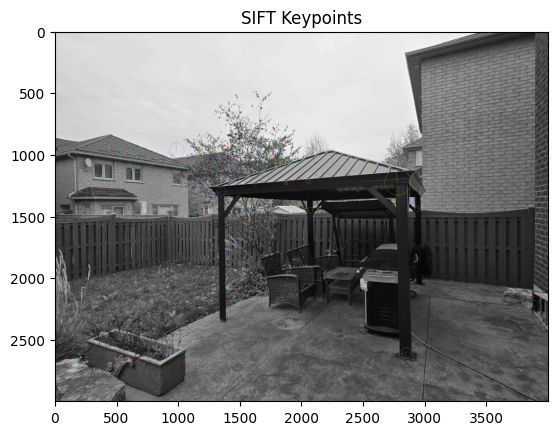

In [84]:
# Initializing SIFT detector
sift = cv2.SIFT_create(nfeatures=20000)

# Detecting keypoints and computing descriptors for the left image
left_kp, left_des = sift.detectAndCompute(left_img_grey,None)

# Drawing keypoints on the left grayscale image
left_img_keypoints = cv2.drawKeypoints(left_img_grey, left_kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the left image
plt.imshow(left_img_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

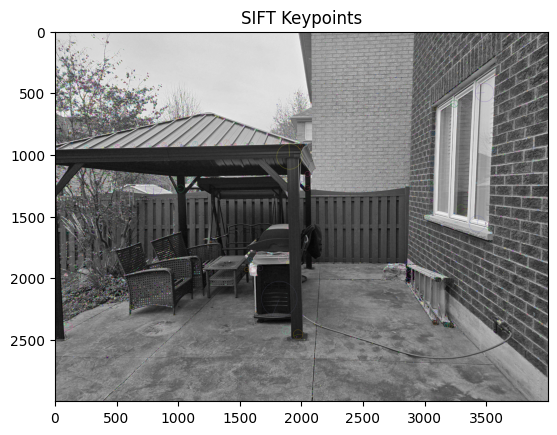

In [85]:
# Detecting keypoints and computing descriptors for the mid image
mid_kp, mid_des = sift.detectAndCompute(mid_img_grey,None)

# Drawing keypoints on the mid grayscale image
mid_img_keypoints = cv2.drawKeypoints(mid_img_grey, mid_kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the mid image
plt.imshow(mid_img_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

 **Step 3)** **Match features** Computing the distances between every SIFT descriptor in one image and every descriptor in the other image.

In [86]:
from scipy.spatial.distance import cdist

# Computing distances between descriptors of left and middle images
left_mid_dist = cdist(left_des, mid_des, 'seuclidean')

print(left_mid_dist.shape)

(20000, 20000)


**Step 4)** **Prune features** Selecting the closest matches based on the matrix of pairwise descriptor distances obtained above and displaying the locations of the inlier matches in both images using plot_inlier_matches.

In [87]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')

    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')

# Usage:
# fig, ax = plt.subplots(figsize=(20,10))
# plot_inlier_matches(ax, img1, img2, computed_inliers)

681


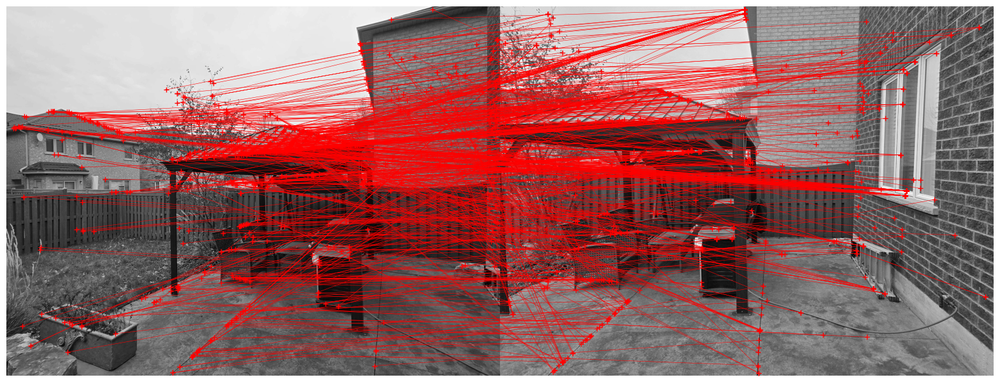

In [88]:
threshold = 4.0
left_mid_matches = []

# Looping through each descriptor
for i in range(len(left_mid_dist)):
  
  # Finding the index of the closest descriptor
  min_index = np.argmin(left_mid_dist[i])
  
  # Checking if the distance is below the threshold
  if left_mid_dist[i][min_index] < threshold:
    left_mid_matches.append((i, min_index))

print(len(left_mid_matches))

# For the left-middle image pair
left_mid_inlier_matches = []

# Looping through each match to extract keypoint coordinates
for i, j in left_mid_matches:
  left_mid_inlier_matches.append([left_kp[i].pt[0], left_kp[i].pt[1],mid_kp[j].pt[0], mid_kp[j].pt[1]])

left_mid_inlier_matches = np.array(left_mid_inlier_matches)

# Displaying inlier matches for left-middle
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, left_img_grey, mid_img_grey, left_mid_inlier_matches)
plt.show()

**Step 5)** **Robust transformation estimation** Implementing RANSAC using homography.

**RANSAC Homography for left and mid images**

In [89]:
import random

# Getting matched points from both images
left_pts = np.array([left_kp[i].pt for i, j in left_mid_matches])
mid_pts = np.array([mid_kp[j].pt for i, j in left_mid_matches])

iterations = 10000
threshold = 80
best_inliers_count = 0
left_mid_best_homography = None

# RANSAC implementation
for iteration in range(iterations):

  # Randomly selecting 4 pairs of points
  i = random.sample(range(len(left_pts)), 4)
  pts_left_pair = left_pts[i]
  pts_mid_pair = mid_pts[i]

  # Calculating the homography matrix
  A = []
  for i in range(len(pts_left_pair)):
    x, y = pts_left_pair[i]
    x_p, y_p = pts_mid_pair[i]
    A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p, x_p])
    A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p, y_p])

  A = np.array(A)

  # Solving for the homography using SVD
  U, S, V = np.linalg.svd(A)
  h = V[len(V)-1]
  
  # Reshaping to get the 3x3 homography matrix
  homography_m = h.reshape(3, 3)

  # Applying the transformation to all points in pts_left
  pts_left_homo = np.ones((left_pts.shape[0], 3))
  pts_left_homo[:, :2] = left_pts
  new_pts_homo = (homography_m @ pts_left_homo.T).T

  # Normalizing (x', y') by dividing by the third coordinate (w) to convert from homogeneous to Cartesian coordinates
  w = new_pts_homo[:, 2, np.newaxis]
  new_pts = new_pts_homo[:, :2] / w

  # Calculating distances to corresponding points in pts_mid
  p_dist = np.linalg.norm(new_pts - mid_pts, axis=1)

  # Determining inliers
  mask = p_dist < threshold
  inliers = np.arange(len(p_dist))[mask]
  inliers_count = np.sum(mask)

  # Updating the best homography if the current one has more inliers
  if inliers_count > best_inliers_count:
    best_inliers_count = inliers_count
    left_mid_best_homography = homography_m
    best_inliers = inliers
    
print(best_inliers_count)
print(left_mid_best_homography)

156
[[-6.27135883e-04 -1.77991467e-05  9.02586290e-01]
 [-9.42206527e-05 -5.05019604e-04  4.30508164e-01]
 [-7.75986724e-08 -5.40321451e-09 -2.29789410e-04]]


 **Step 6)** **Compute optimal transformation** Computing the optimal transformation using all the inliers of the best transformation found using RANSAC.

In [90]:
# Extracting inliers points based on the best inliers
left_inlier_pts = left_pts[best_inliers]
mid_inlier_pts = mid_pts[best_inliers]

A = []
for i in range(len(left_inlier_pts)):
  x, y = left_inlier_pts[i]
  x_p, y_p = mid_inlier_pts[i]
    
  # Homogeneous system of equations for each inlier correspondence
  A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p, x_p])
  A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p, y_p])

A = np.array(A)

# Solving for homography using SVD
U, S, V = np.linalg.svd(A)
h = V[len(V)-1]

# Reshaping to get the 3x3 homography matrix
left_mid_final_homography_m = h.reshape(3, 3)

print(left_mid_final_homography_m)

[[ 6.06627840e-04  3.25247481e-05 -8.92420415e-01]
 [ 9.67283252e-05  5.12955942e-04 -4.51204075e-01]
 [ 7.52330090e-08  1.65842998e-08  2.10676771e-04]]


 **Step 7)** **Create panorama**

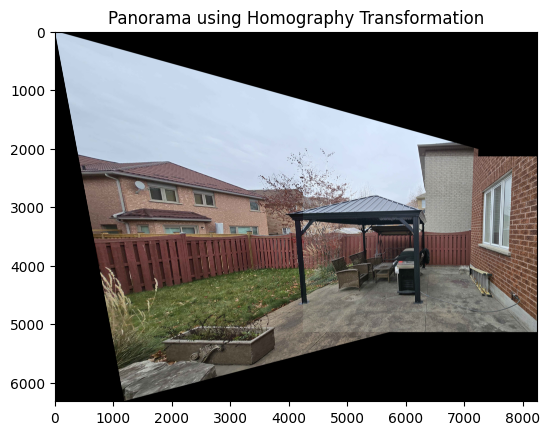

In [91]:
from skimage import transform

# Converting images from RGB to BGR
left_img_bgr = cv2.cvtColor(left_img, cv2.COLOR_RGB2BGR)
mid_img_bgr = cv2.cvtColor(mid_img, cv2.COLOR_RGB2BGR)

# Creating the projective transform using the homography matrix
proj_transform = transform.ProjectiveTransform(matrix=left_mid_final_homography_m)

# Creating the mosaic boundaries and canvas size
height, width = left_img_bgr.shape[:2]
corners_img_left = np.array([[0, 0], [width, 0], [0, height], [width, height]])
corners_trans = proj_transform(corners_img_left)

x_min = min(0, corners_trans[:, 0].min())
y_min = min(0, corners_trans[:, 1].min())
x_max = max(mid_img_bgr.shape[1], corners_trans[:, 0].max())
y_max = max(mid_img_bgr.shape[0], corners_trans[:, 1].max())

left_mid_mosaic = np.zeros((int(y_max - y_min), int(x_max - x_min), 3), dtype=np.float32)

# Placing img_mid onto the mosaic as the base image
left_mid_mosaic[-int(y_min):-int(y_min) + mid_img_bgr.shape[0], -int(x_min):-int(x_min) + mid_img_bgr.shape[1]] = mid_img_bgr / 255

# Adjusting the transformation to account for the offset if min_x or min_y is negative
translation_m = np.array([[1, 0, -x_min],[0, 1, -y_min],[0, 0, 1]])
adjusted_transform = translation_m @ left_mid_final_homography_m

proj_transform2 = transform.ProjectiveTransform(matrix=adjusted_transform)

# Warping img_left onto the mosaic
warped_img_left = transform.warp(left_img_bgr, inverse_map=proj_transform2.inverse, output_shape=(int(y_max - y_min), int(x_max - x_min)))

# Blending images by taking the max pixel value
for channel in range(3):
  left_mid_mosaic[..., channel] = np.maximum(left_mid_mosaic[..., channel], warped_img_left[..., channel])
  
# Displaying the colour mosaic result
plt.imshow(cv2.cvtColor(left_mid_mosaic, cv2.COLOR_BGR2RGB))
plt.title("Panorama using Homography Transformation")
plt.show()

**Repeating the previous steps using left_mid_mosaic (left-mid image) and the right image**

 **Step 1)** **Preprocessing** Loading the images and convert to grayscale.

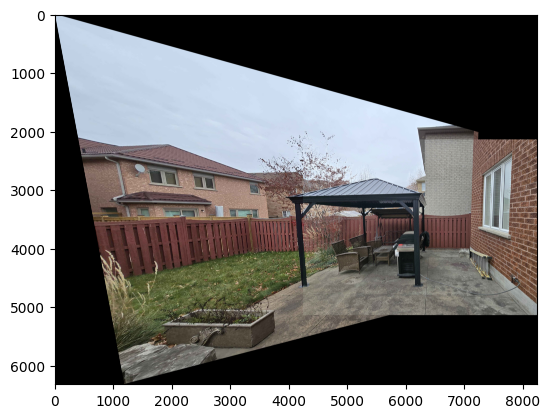

In [92]:
# Converting BGR mosaic image to RGB
lm_img = cv2.cvtColor(left_mid_mosaic, cv2.COLOR_BGR2RGB) # left-mid image
plt.imshow(lm_img)
plt.show()

lm_img = (lm_img * 255).astype(np.uint8)

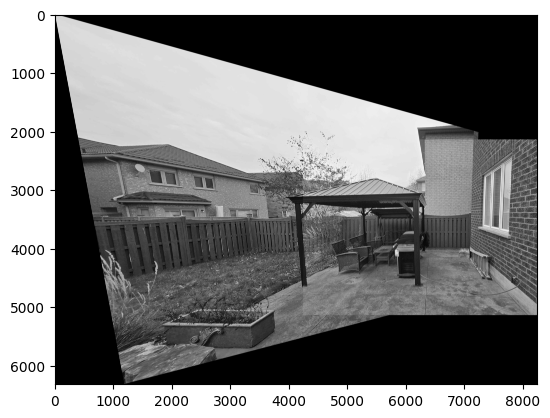

In [93]:
lm_img_grey = cv2.cvtColor(lm_img, cv2.COLOR_BGR2GRAY)
plt.imshow(lm_img_grey, cmap='gray')
plt.show()

 **Step 2)** **Detect keypoints and extract descriptors**

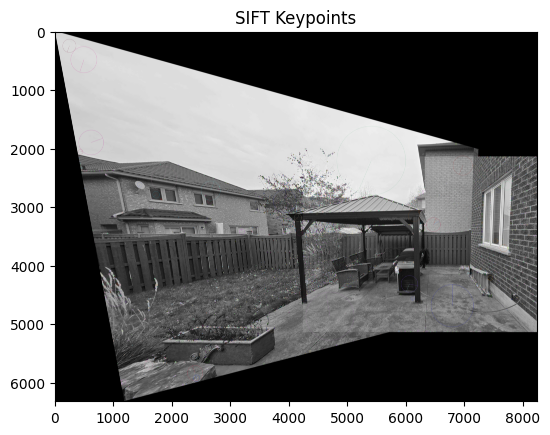

In [94]:
# Initializing SIFT detector with it having at most 20000 features
sift = cv2.SIFT_create(nfeatures=20000)

# Detecting keypoints and computing descriptors for the mosaic
lm_kp, lm_des = sift.detectAndCompute(lm_img_grey, None)

# Drawing keypoints on the grayscale mosiac
lm_img_keypoints = cv2.drawKeypoints(lm_img_grey, lm_kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the mosaic
plt.imshow(lm_img_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

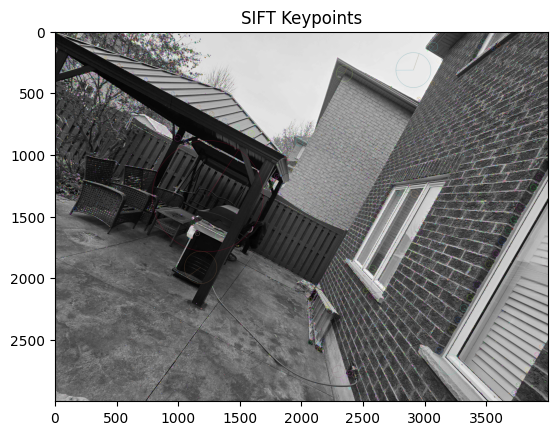

In [95]:
# Detecting keypoints and computing descriptors for the right image
right_kp, right_des = sift.detectAndCompute(rigt_img_grey,None)

# Drawing keypoints on the right grayscale image
right_img_keypoints = cv2.drawKeypoints(rigt_img_grey, right_kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the keypoints on the right image
plt.imshow(right_img_keypoints, cmap='gray')
plt.title("SIFT Keypoints")
plt.show()

 **Step 3)** **Match features** Computing distances between every SIFT descriptor in one image and every descriptor in the other image.

In [96]:
from scipy.spatial.distance import cdist

# Computing distances between descriptors of the mosiac and the right image
lm_right_dist = cdist(lm_des, right_des, 'seuclidean')

print(lm_right_dist.shape)

(20000, 20000)


  **Step 4)** **Prune features** Selecting the closest matches based on the matrix of pairwise descriptor distances obtained above and displaying the locations of the inlier matches in both images using plot_inlier_matches.

446


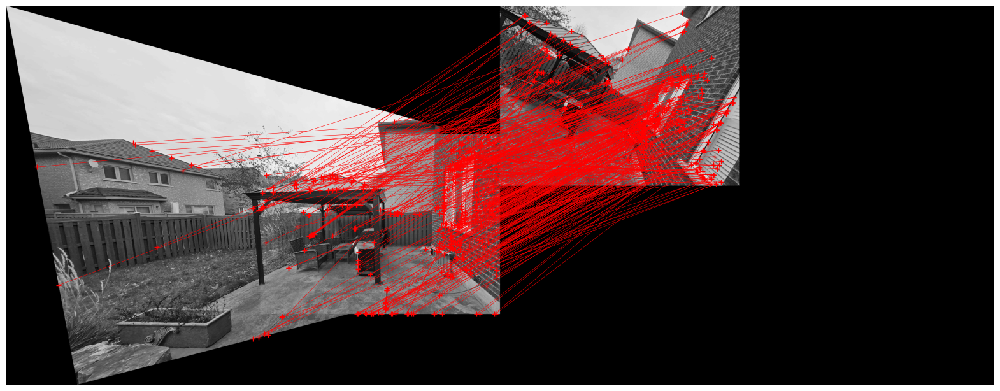

In [97]:
threshold = 3.0
lf_right_matches = []

# Looping through each descriptor
for i in range(len(lm_right_dist)):
  
  # Finding the index of the closest descriptor
  min_index = np.argmin(lm_right_dist[i])
  
  # Checking if the distance is below the threshold
  if lm_right_dist[i][min_index] < threshold:
    lf_right_matches.append((i, min_index))

print(len(lf_right_matches))

# For the left-middle image pair
lm_right_inlier_matches = []

# Looping through each match to extract keypoint coordinates
for i, j in lf_right_matches:
  
  # Appending the coordinates of the matching keypoints from both images
  lm_right_inlier_matches.append([lm_kp[i].pt[0], lm_kp[i].pt[1],right_kp[j].pt[0], right_kp[j].pt[1]])

lm_right_inlier_matches = np.array(lm_right_inlier_matches)


# Padding the right image
right_img_padded = np.pad(rigt_img_grey, ((0, lm_img_grey.shape[0] - rigt_img_grey.shape[0]), ( 0, lm_img_grey.shape[1] - rigt_img_grey.shape[1])), mode='constant', constant_values=0)

# Displaying inlier matches for left-middle
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, lm_img_grey, right_img_padded, lm_right_inlier_matches)
plt.show()

**Step 5)** **Robust transformation estimation** Implementing RANSAC using homography.

**RANSAC Homography for left-mid and right images**

In [98]:
# Getting matched points from both images
lm_pts = np.array([lm_kp[i].pt for i, j in lf_right_matches])
right_pts = np.array([right_kp[j].pt for i, j in lf_right_matches])

iterations = 10000
threshold = 30
best_inliers_count = 0
lm_right_best_homography = None

# RANSAC implementation
for iteration in range(iterations):

  # Randomly selecting 4 pairs of points
  i = random.sample(range(len(lm_pts)), 4)
  pts_lm_pair = lm_pts[i]
  pts_right_pair = right_pts[i]

  # Calculating the homography matrix
  A = []
  for i in range(len(pts_lm_pair)):
    x, y = pts_lm_pair[i]
    x_p, y_p = pts_right_pair[i]
    A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p, x_p])
    A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p, y_p])

  A = np.array(A)

  # Solving for the homography using SVD
  U, S, V = np.linalg.svd(A)
  h = V[len(V)-1]
  
  # Reshaping to get the 3x3 homography matrix
  homography_m = h.reshape(3, 3)

  # Applying the transformation to all points in pts_lm (left-middle)
  pts_lm_homo = np.ones((lm_pts.shape[0], 3)) 
  pts_lm_homo[:, :2] = lm_pts
  new_pts_homo = (homography_m @ pts_lm_homo.T).T

  # Normalizing (x', y') by dividing by the third coordinate (w) to convert from homogeneous to Cartesian coordinates
  w = new_pts_homo[:, 2, np.newaxis]
  new_pts = new_pts_homo[:, :2] / w

  # Calculating distances to corresponding points in pts_right (right image)
  p_dist = np.linalg.norm(new_pts - right_pts, axis=1)

  # Determining inliers
  mask = p_dist < threshold
  inliers = np.arange(len(p_dist))[mask]
  inliers_count = np.sum(mask)

  # Updating the best homography if the current one has more inliers
  if inliers_count > best_inliers_count:
    best_inliers_count = inliers_count
    lm_right_best_homography = homography_m
    best_inliers = inliers
    
print(best_inliers_count)
print(lm_right_best_homography)    

201
[[-1.84658239e-04  1.08941445e-04  3.60725811e-01]
 [-1.06119019e-04 -1.71057680e-04  9.32671834e-01]
 [-5.16352991e-09  5.48841146e-09 -2.29945143e-04]]


 **Step 6)** **Compute optimal transformation** Computing the optimal transformation using all the inliers of the best transformation found using RANSAC.

In [99]:
# Extracting inliers points based on the best inliers
lm_inlier_pts = lm_pts[best_inliers]
right_inlier_pts = right_pts[best_inliers]

A = []
for i in range(len(lm_inlier_pts)):
  x, y = lm_inlier_pts[i]
  x_p, y_p = right_inlier_pts[i]
    
  # Homogeneous system of equations for each inlier correspondence
  A.append([-x, -y, -1, 0, 0, 0, x * x_p, y * x_p, x_p])
  A.append([0, 0, 0, -x, -y, -1, x * y_p, y * y_p, y_p])

A = np.array(A)

# Solving for homography using SVD
U, S, V = np.linalg.svd(A)
h = V[len(V)-1]

# Reshaping to get the 3x3 homography matrix
lm_right_final_homography_m = h.reshape(3, 3)

print(lm_right_final_homography_m)

[[-1.80756679e-04  1.05260203e-04  3.59023830e-01]
 [-1.06387450e-04 -1.67249963e-04  9.33328325e-01]
 [-6.58345908e-09  5.19308378e-09 -2.11701789e-04]]


 **Step 7)** **Create panorama**

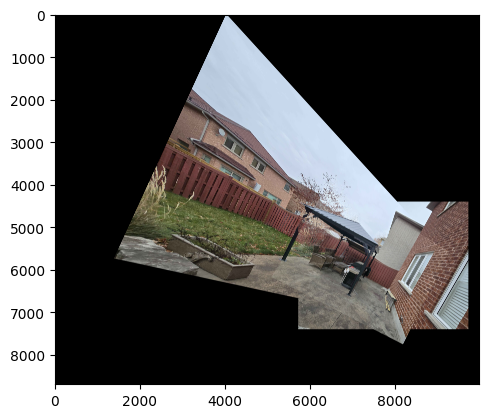

In [100]:
from skimage import transform

# Converting images from RGB to BGR
lm_img_bgr = cv2.cvtColor(lm_img, cv2.COLOR_RGB2BGR)
right_img_bgr = cv2.cvtColor(right_img, cv2.COLOR_RGB2BGR)

# Creating the projective transform using the homography matrix
proj_transform = transform.ProjectiveTransform(matrix=lm_right_final_homography_m)

# Creating the mosaic boundaries and canvas size
height, width = lm_img_bgr.shape[:2]
corners_img_lm = np.array([[0, 0], [width, 0], [0, height], [width, height]])
corners_trans = proj_transform(corners_img_lm)

x_min = min(0, corners_trans[:, 0].min())
y_min = min(0, corners_trans[:, 1].min())
x_max = max(right_img_bgr.shape[1], corners_trans[:, 0].max())
y_max = max(right_img_bgr.shape[0], corners_trans[:, 1].max())

lm_right_mosaic = np.zeros((int(y_max - y_min), int(x_max - x_min), 3), dtype=np.float32)

# Placing img_right onto the mosaic as the base image
lm_right_mosaic[-int(y_min):-int(y_min) + right_img_bgr.shape[0], -int(x_min):-int(x_min) + right_img_bgr.shape[1]] = right_img_bgr / 255

# Adjusting the transformation to account for the offset if min_x or min_y is negative
translation_m = np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]])
adjusted_transform_lm_right = translation_m @ lm_right_final_homography_m

proj_transform2 = transform.ProjectiveTransform(matrix=adjusted_transform_lm_right)

# Warping img_lm (Left-Mid) onto the mosaic
warped_img_lm = transform.warp(lm_img_bgr, inverse_map=proj_transform2.inverse, output_shape=(int(y_max - y_min), int(x_max - x_min)))

# Blending images by taking the max pixel value
for channel in range(3):
  lm_right_mosaic[..., channel] = np.maximum(lm_right_mosaic[..., channel], warped_img_lm[..., channel])
  
# Displaying the final combined panorama
plt.imshow(cv2.cvtColor(lm_right_mosaic, cv2.COLOR_BGR2RGB))
plt.show()
